In [1]:
import xarray as xr
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

import cartopy
import cartopy.crs as ccrs
import matplotlib
%matplotlib inline
from netCDF4 import Dataset


import iris
import iris.plot as iplt
import iris.quickplot as qplt
import matplotlib.colors as colors
from sklearn import datasets
import iris.analysis
import numpy.ma as ma

import matplotlib.ticker as mticker
from matplotlib.ticker import MultipleLocator
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
from cartopy.util import add_cyclic_point


from iris.experimental.regrid import regrid_weighted_curvilinear_to_rectilinear

import matplotlib.cm as mpl_cm
from matplotlib.collections import LineCollection
from matplotlib.colors import ListedColormap, BoundaryNorm
from matplotlib.pyplot import xcorr


from scipy.interpolate import splrep, splev
from scipy.stats import pearsonr
from scipy import signal 

import math
from matplotlib import mlab

import warnings
warnings.filterwarnings("ignore")

In [2]:
filename_1='CCSM4_midHolocene.cvdp_data.1000-1300.nc'
ccsm=xr.open_dataset(filename_1,decode_times=False)

filename_2='CCSM4_piControl.cvdp_data.250-1300.nc'
pi_ccsm=xr.open_dataset(filename_2,decode_times=False)

filename_3='CESM2_midHolocene.cvdp_data.1-700.nc'
cesm=xr.open_dataset(filename_3,decode_times=False)

filename_4='CESM2_piControl.cvdp_data.701-1200.nc'
pi_cesm=xr.open_dataset(filename_4,decode_times=False)

filename_5='EC-Earth3-LR_midHolocene.cvdp_data.2245-2445.nc'
ec=xr.open_dataset(filename_5,decode_times=False)

filename_6='EC-Earth3-LR_piControl.cvdp_data.2219-2419.nc'
pi_ec=xr.open_dataset(filename_6,decode_times=False)

filename_7='FGOALS-g2_midHolocene.cvdp_data.340-1019.nc'
fgoalsg2=xr.open_dataset(filename_7,decode_times=False)

filename_8='FGOALS-g2_piControl.cvdp_data.201-900.nc'
pi_fgoalsg2=xr.open_dataset(filename_8,decode_times=False)


filename_11='GISS-E2-1-G_midHolocene.cvdp_data.2900-2999.nc'
giss=xr.open_dataset(filename_11,decode_times=False)

filename_12='GISS-E2-1-G_piControl.cvdp_data.4150-5000.nc'
pi_giss=xr.open_dataset(filename_12,decode_times=False)

filename_13='HadGEM3-GC31-LL_midHolocene.cvdp_data.2250-2349.nc'
hadgem=xr.open_dataset(filename_13,decode_times=False)

filename_14='HadGEM3-GC31-LL_piControl.cvdp_data.2250-2349.nc'
pi_hadgem=xr.open_dataset(filename_14,decode_times=False)

filename_15='INM-CM4-8_midHolocene.cvdp_data.1880-2079.nc'
inm=xr.open_dataset(filename_15,decode_times=False)

filename_16='INM-CM4-8_piControl.cvdp_data.1850-2380.nc'
pi_inm=xr.open_dataset(filename_16,decode_times=False)

filename_17='IPSL-CM6A-LR_midHolocene.cvdp_data.1850-2399.nc'
ipsl=xr.open_dataset(filename_17,decode_times=False)

filename_18='IPSL-CM6A-LR_piControl.cvdp_data.1850-3049.nc'
pi_ipsl=xr.open_dataset(filename_18,decode_times=False)


filename_21='MPI-ESM1-2-LR_midHolocene.cvdp_data.1001-1500.nc'
mpi2=xr.open_dataset(filename_21,decode_times=False)

filename_22='MPI-ESM1-2-LR_piControl.cvdp_data.1850-2849.nc'
pi_mpi2=xr.open_dataset(filename_22,decode_times=False)

filename_23='MRI-ESM2-0_midHolocene.cvdp_data.1951-2150.nc'
mri=xr.open_dataset(filename_23,decode_times=False)

filename_24='MRI-ESM2-0_piControl.cvdp_data.1850-2550.nc'
pi_mri=xr.open_dataset(filename_24,decode_times=False)

filename_25='MPI-ESM-P_midHolocene.cvdp_data.1850-1949.nc'
mpip=xr.open_dataset(filename_25,decode_times=False)

filename_26='MPI-ESM-P_piControl.cvdp_data.1850-3005.nc'
pi_mpip=xr.open_dataset(filename_26,decode_times=False)


filename_27='MRI-CGCM3_midHolocene.cvdp_data.1951-2050.nc'
mri3=xr.open_dataset(filename_27,decode_times=False)

filename_28='MRI-CGCM3_piControl.cvdp_data.1851-2350.nc'
pi_mri3=xr.open_dataset(filename_28,decode_times=False)

filename_29='NorESM2-LM_midHolocene.cvdp_data.2101-2200.nc'
noresm2=xr.open_dataset(filename_29,decode_times=False)

filename_30='NorESM2-LM_piControl.cvdp_data.1710-2100.nc'
pi_noresm2=xr.open_dataset(filename_30,decode_times=False)



## load the variable: amoc_mean_ann in mh & pi 

In [3]:
ccsm_amoc_mean=ccsm.amoc_mean_ann
pi_ccsm_amoc_mean=pi_ccsm.amoc_mean_ann

cesm_amoc_mean=cesm.amoc_mean_ann
pi_cesm_amoc_mean=pi_cesm.amoc_mean_ann

ec_amoc_mean=ec.amoc_mean_ann
pi_ec_amoc_mean=pi_ec.amoc_mean_ann

fgoalsg2_amoc_mean=fgoalsg2.amoc_mean_ann
pi_fgoalsg2_amoc_mean=pi_fgoalsg2.amoc_mean_ann

giss_amoc_mean=giss.amoc_mean_ann
pi_giss_amoc_mean=pi_giss.amoc_mean_ann

hadgem_amoc_mean=hadgem.amoc_mean_ann
pi_hadgem_amoc_mean=pi_hadgem.amoc_mean_ann

inm_amoc_mean=inm.amoc_mean_ann
pi_inm_amoc_mean=pi_inm.amoc_mean_ann

ipsl_amoc_mean=ipsl.amoc_mean_ann
pi_ipsl_amoc_mean=pi_ipsl.amoc_mean_ann

mpi2_amoc_mean=mpi2.amoc_mean_ann
pi_mpi2_amoc_mean=pi_mpi2.amoc_mean_ann

mri_amoc_mean=mri.amoc_mean_ann
pi_mri_amoc_mean=pi_mri.amoc_mean_ann

mpip_amoc_mean=mpip.amoc_mean_ann
pi_mpip_amoc_mean=pi_mpip.amoc_mean_ann

mri3_amoc_mean=mri3.amoc_mean_ann
pi_mri3_amoc_mean=pi_mri3.amoc_mean_ann

noresm2_amoc_mean=noresm2.amoc_mean_ann
pi_noresm2_amoc_mean=pi_noresm2.amoc_mean_ann



In [7]:
amoc_mean=[ccsm_amoc_mean, cesm_amoc_mean, ec_amoc_mean, fgoalsg2_amoc_mean, giss_amoc_mean,
          hadgem_amoc_mean, inm_amoc_mean, ipsl_amoc_mean, mpi2_amoc_mean, mri_amoc_mean,
          mpip_amoc_mean, mri3_amoc_mean, noresm2_amoc_mean]

In [8]:
pi_amoc_mean=[pi_ccsm_amoc_mean, pi_cesm_amoc_mean, pi_ec_amoc_mean, pi_fgoalsg2_amoc_mean, pi_giss_amoc_mean,
          pi_hadgem_amoc_mean, pi_inm_amoc_mean, pi_ipsl_amoc_mean, pi_mpi2_amoc_mean, pi_mri_amoc_mean,
          pi_mpip_amoc_mean, pi_mri3_amoc_mean, pi_noresm2_amoc_mean]

In [9]:
modelname=['ccsm', 'cesm', 'ec', 'fgoalsg2', 'giss',
          'hadgem', 'inm', 'ipsl', 'mpi2', 'mri',
          'mpip', 'mri3', 'noresm2']

## select the maximum AMOC in the region of 25~50N 

In [91]:
print(ccsm_amoc_mean.lat_amoc[270:322])

<xarray.DataArray 'lat_amoc' (lat_amoc: 52)>
array([24.41448 , 24.866369, 25.32696 , 25.796089, 26.27356 , 26.75906 ,
       27.252239, 27.75267 , 28.259821, 28.7731  , 29.29184 , 29.815319,
       30.34272 , 30.873199, 31.40587 , 31.939791, 32.47401 , 33.008259,
       33.5425  , 34.076729, 34.61097 , 35.14521 , 35.679451, 36.213699,
       36.747929, 37.282169, 37.81641 , 38.350651, 38.884899, 39.419128,
       39.953369, 40.48761 , 41.021851, 41.556099, 42.09034 , 42.624569,
       43.15881 , 43.69305 , 44.227291, 44.761539, 45.295769, 45.830009,
       46.36425 , 46.898491, 47.432739, 47.966969, 48.501209, 49.03545 ,
       49.569691, 50.103939, 50.63818 , 51.172409])
Coordinates:
  * lat_amoc  (lat_amoc) float64 24.41 24.87 25.33 25.8 ... 50.1 50.64 51.17
Attributes:
    standard_name:  latitude
    long_name:      latitude
    axis:           Y
    units:          degrees_north
    bounds:         lat_bnds


In [10]:
for n in range (0,len(modelname)):
    globals()[modelname[n]+'_lat25_50_amoc']=amoc_mean[n].sel(lat_amoc=slice(25,50.5))  #compute column by column, first time get the first value for each latitude

In [11]:
for j in range (0,len(modelname)):
    globals()['pi_'+ modelname[j]+'_lat25_50_amoc']=pi_amoc_mean[j].sel(lat_amoc=slice(25,50.5))

In [12]:
data9=[]
for n in range (0,len(modelname)):
    data7=np.vstack([globals()[modelname[n]+'_lat25_50_amoc']]) 
    data8=np.nanmax(data7,axis=0)
    data9.append(np.nanmax(data8))

In [13]:
print(data9)

[25.481926, 24.324865, 19.036257, 29.67317, 28.328012, 18.456553, 20.06934, 12.36543, 22.616209, 24.88138, 22.98574, 17.407293, 23.98823]


In [14]:
data12=[]
for j in range (0,len(modelname)):
    data10=np.vstack([globals()['pi_'+ modelname[j]+'_lat25_50_amoc']]) 
    data11=np.nanmax(data10,axis=0)
    data12.append(np.nanmax(data11))

In [15]:
print(data12)

[26.281664, 23.803553, 18.760246, 30.090815, 27.983944, 17.06548, 20.681675, 12.898706, 22.693687, 22.046486, 21.952442, 15.658391, 23.600851]


## the differences of maximum AMOC in 25-50N between mh and pi in each model

In [16]:
max_amoc_diff_25=[]
for i in range (0, len(modelname)):
    max_amoc_diff_25.append(data9[i]-data12[i])
print(max_amoc_diff_25)

[-0.79973793, 0.5213127, 0.2760105, -0.4176445, 0.34406853, 1.3910732, -0.6123352, -0.53327656, -0.07747841, 2.8348942, 1.0332985, 1.7489023, 0.3873787]


In [3]:
model_name=['CCSM4','CESM2','EC_Earth3-LR','FGOALS-G2','GISS-E2-1-G','HadGEM3-CG31-LL',
           'INM-CM4-8','IPSL-CM6A-LR','MPI-ESM1-2-LR','MRI-ESM2-0','MPI-ESM-P','MRI-CGCM3',
           'NorESM2-LM']

In [4]:
legend_color=['orangered','orange','yellow','limegreen','deepskyblue','slategrey','darkorchid',
            'chocolate','darkgreen','turquoise','violet','blue','pink']

## plotting: maximum AMOC  at 25-40N in simulations in mh &pi-ctrl

[Text(0.5, 1.0, 'maximum AMOC at 25N~50N in simulations (MH and PI)')]

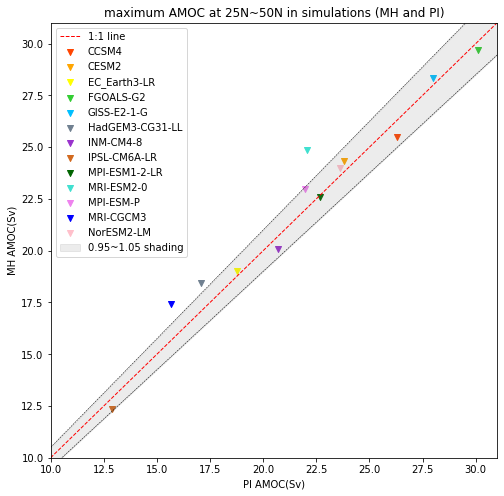

In [20]:
fig=plt.figure(figsize=(8,8)) 

ax=fig.add_subplot(111)

for k in range (0,len(modelname)):
    ax.scatter(data12[k], data9[k], label=model_name[k], color=legend_color[k], marker='v')


x=np.linspace(10,31,100)
y=x
ax.plot(x,y,'--',linewidth=1, color='r',label='1:1 line')
ax.plot(x,0.95*y, '--',linewidth=0.5, color='black')
ax.plot(x,1.05*y, '--',linewidth=0.5, color='black')
ax.fill_between(x, 0.95*y, 1.05*y, color='grey', alpha=0.15, label='0.95~1.05 shading')
ax.set(xlabel='PI AMOC(Sv)',ylabel='MH AMOC(Sv)')
ax.set_xlim(10,31)
ax.set_ylim(10,31)
ax.legend(loc='best')
ax.set(title='maximum AMOC at 25N~50N in simulations (MH and PI)')

## load the variable: amoc & sst /tas  (annual) regression 

In [49]:
ccsm_amoc_sst=ccsm.amoc_sst_regression_ann
pi_ccsm_amoc_sst=pi_ccsm.amoc_sst_regression_ann

cesm_amoc_sst=cesm.amoc_sst_regression_ann
pi_cesm_amoc_sst=pi_cesm.amoc_sst_regression_ann

ec_amoc_sst=ec.amoc_sst_regression_ann
pi_ec_amoc_sst=pi_ec.amoc_sst_regression_ann

fgoalsg2_amoc_sst=fgoalsg2.amoc_sst_regression_ann
pi_fgoalsg2_amoc_sst=pi_fgoalsg2.amoc_sst_regression_ann

giss_amoc_sst=giss.amoc_sst_regression_ann
pi_giss_amoc_sst=pi_giss.amoc_sst_regression_ann

hadgem_amoc_sst=hadgem.amoc_sst_regression_ann
pi_hadgem_amoc_sst=pi_hadgem.amoc_sst_regression_ann

inm_amoc_sst=inm.amoc_sst_regression_ann
pi_inm_amoc_sst=pi_inm.amoc_sst_regression_ann

ipsl_amoc_sst=ipsl.amoc_sst_regression_ann
pi_ipsl_amoc_sst=pi_ipsl.amoc_sst_regression_ann

mpi2_amoc_sst=mpi2.amoc_sst_regression_ann
pi_mpi2_amoc_sst=pi_mpi2.amoc_sst_regression_ann

mri_amoc_sst=mri.amoc_sst_regression_ann
pi_mri_amoc_sst=pi_mri.amoc_sst_regression_ann

mpip_amoc_sst=mpip.amoc_sst_regression_ann
pi_mpip_amoc_sst=pi_mpip.amoc_sst_regression_ann

mri3_amoc_sst=mri3.amoc_sst_regression_ann
pi_mri3_amoc_sst=pi_mri3.amoc_sst_regression_ann

noresm2_amoc_sst=noresm2.amoc_sst_regression_ann
pi_noresm2_amoc_sst=pi_noresm2.amoc_sst_regression_ann



In [50]:
amoc_sst=[ccsm_amoc_sst, cesm_amoc_sst, ec_amoc_sst, fgoalsg2_amoc_sst, 
         giss_amoc_sst, hadgem_amoc_sst, inm_amoc_sst, ipsl_amoc_sst, 
         mpi2_amoc_sst, mri_amoc_sst, mpip_amoc_sst, mri3_amoc_sst, 
          noresm2_amoc_sst]

In [51]:
pi_amoc_sst=[pi_ccsm_amoc_sst, pi_cesm_amoc_sst, pi_ec_amoc_sst, pi_fgoalsg2_amoc_sst, 
         pi_giss_amoc_sst, pi_hadgem_amoc_sst, pi_inm_amoc_sst, pi_ipsl_amoc_sst, 
         pi_mpi2_amoc_sst, pi_mri_amoc_sst, pi_mpip_amoc_sst, pi_mri3_amoc_sst, 
         pi_noresm2_amoc_sst]

In [52]:
for j in range (0,len(modelname)):
    globals()[modelname[j]+'_amoc_sst_regression_change']=abs(amoc_sst[j]) - abs(pi_amoc_sst[j])
    
    # positive value means MH has a larger coefficient (steep slope) for the linear regression, 
    # while negative value means pi has a larger coefficient for the linear regression
    
    #darker colour shows a more significant coefficient change between filled_contour(MH) and contour(pi)

In [11]:
name=[ccsm,cesm,ec,fgoalsg2,
      giss,hadgem,inm,ipsl,
      mpi2,mri,mpip,mri3,noresm2]

In [12]:
pi_name=[pi_ccsm, pi_cesm, pi_ec, pi_fgoalsg2,
         pi_giss, pi_hadgem, pi_inm, pi_ipsl,
         pi_mpi2, pi_mri, pi_mpip, pi_mri3,
         pi_noresm2]

## plotting: map plot of the coefficient for the regression of sst & amoc in mh & pi 

SST anomalies (in Celsius) at each grid box are regressed upon AMOC timeseries.

changes of the coefficient computed using absolute values  # (mh minus pi)  # abs(amoc_sst[j]) - abs(pi_amoc_sst[j])

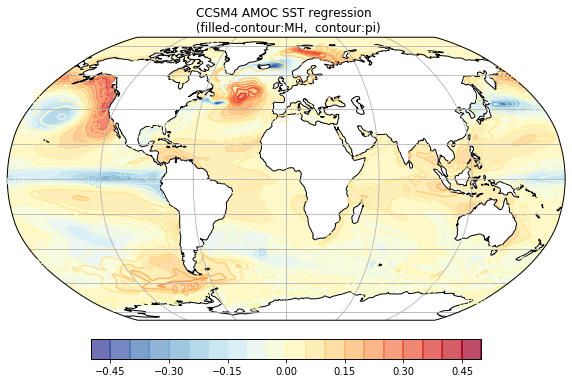

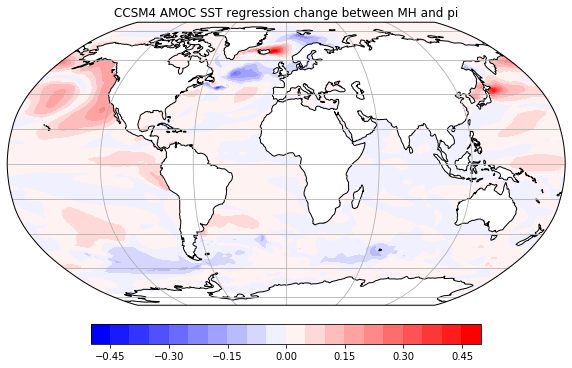

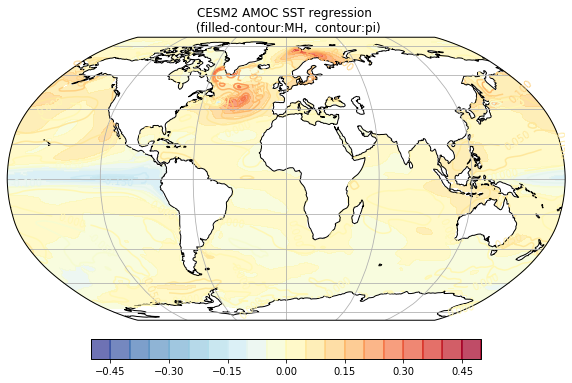

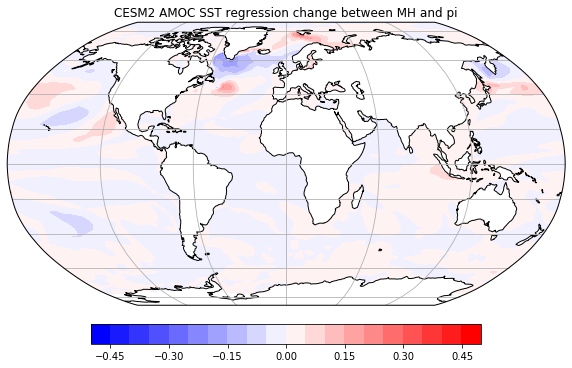

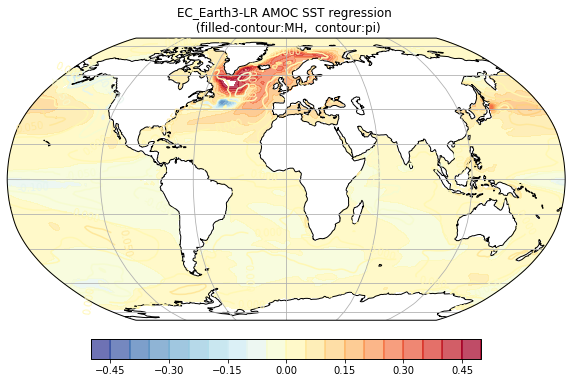

...

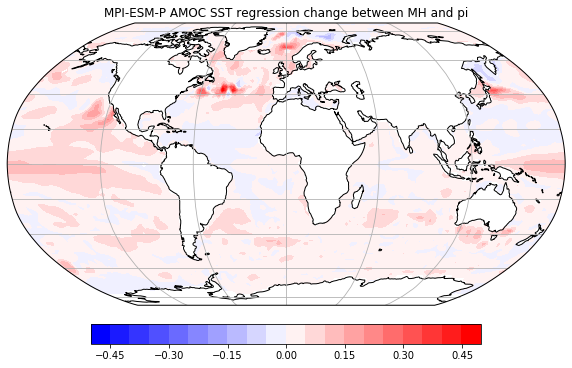

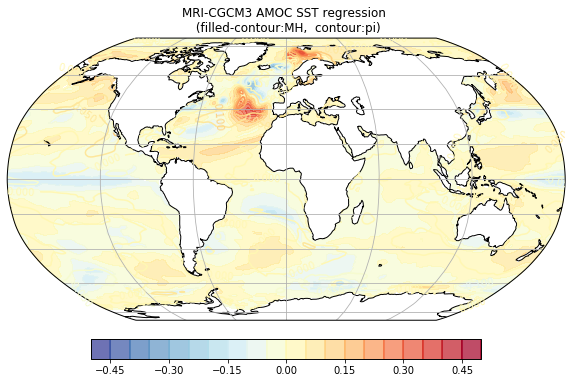

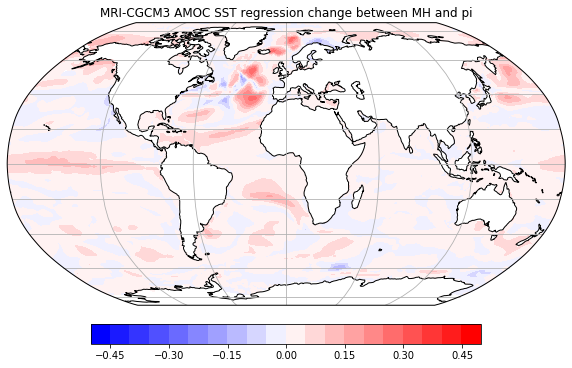

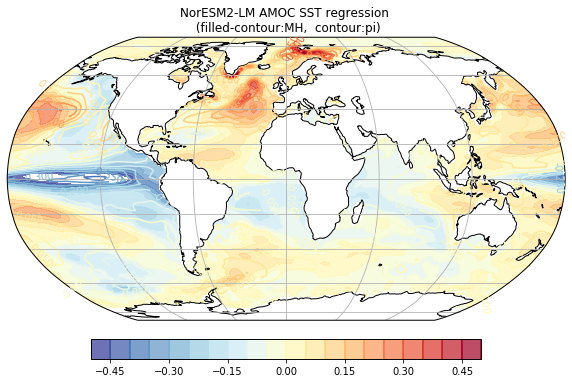

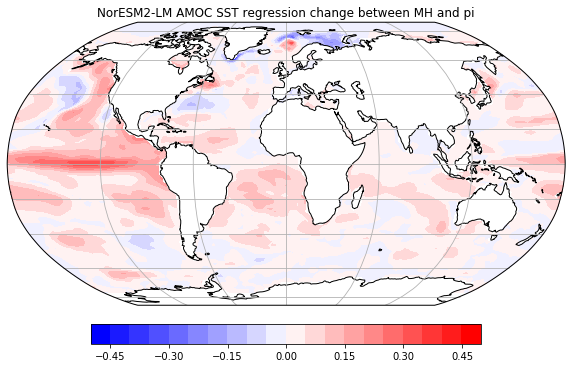

In [53]:
for i in range (0,len(modelname)):

    projection = ccrs.Robinson()

    transform=ccrs.PlateCarree()
    bounds = np.linspace(-0.5,0.5,21)
    norm = colors.BoundaryNorm(boundaries=bounds, ncolors=256)

    lat = name[i].lat
    lon = name[i].lon

    pi_lat = pi_name[i].lat
    pi_lon = pi_name[i].lon

    amoc_sst[i], lon = add_cyclic_point(amoc_sst[i], coord=lon)
    pi_amoc_sst[i], pi_lon = add_cyclic_point(pi_amoc_sst[i], coord=pi_lon)

    plt.figure(figsize=(10,7))
    ax1= plt.axes(projection=projection)

    ax1.coastlines()
    
    ax1.gridlines()
    

    fig=ax1.contourf(lon,lat, amoc_sst[i], levels=bounds, transform=transform, cmap='RdYlBu_r',norm=norm, alpha=0.7)
    pi_fig=ax1.contour(pi_lon, pi_lat, pi_amoc_sst[i], levels=bounds, transform=transform, cmap='RdYlBu_r',norm=norm)
    
    #pi_fig=ax1.contour(pi_lon, pi_lat, pi_amoc_sst[i], levels=bounds, transform=transform, colors='blue',norm=norm)
    #If linestyles is None, the default is 'solid' unless the lines are monochrome. In that case, negative contours will be'dashed-line' 

    ax1.clabel(pi_fig, inline=1, fontsize=10)

    cax,kw = matplotlib.colorbar.make_axes(ax1,location='bottom',pad=0.05,shrink=0.7)
    plt.colorbar(fig,cax=cax,extend='both',**kw)
    plt.colorbar(pi_fig,cax=cax,extend='both',**kw)
    ax1.set(title='%s AMOC SST regression \n (filled-contour:MH,  contour:pi)' %(model_name[i]))

#-------------------------------------------------------------------

    lat_2 = name[i].lat
    lon_2 = name[i].lon

    globals()[modelname[i]+'_amoc_sst_regression_change'], lon_2 = add_cyclic_point(globals()[modelname[i]+'_amoc_sst_regression_change'], coord=lon_2)

    plt.figure(figsize=(10,7))
    ax2= plt.axes(projection=projection)

    ax2.coastlines()
    
    ax2.gridlines()
    
    fig_2=ax2.contourf(lon,lat,globals()[modelname[i]+'_amoc_sst_regression_change'],levels=bounds, transform=transform,cmap='bwr',norm=norm)
    
    cax,kw = matplotlib.colorbar.make_axes(ax2,location='bottom',pad=0.05,shrink=0.7)
    plt.colorbar(fig_2,cax=cax,extend='both',**kw)
    ax2.set(title='%s AMOC SST regression change between MH and pi' %(model_name[i]))
    

In [54]:
ccsm_amoc_tas=ccsm.amoc_tas_regression_ann
pi_ccsm_amoc_tas=pi_ccsm.amoc_tas_regression_ann

cesm_amoc_tas=cesm.amoc_tas_regression_ann
pi_cesm_amoc_tas=pi_cesm.amoc_tas_regression_ann

ec_amoc_tas=ec.amoc_tas_regression_ann
pi_ec_amoc_tas=pi_ec.amoc_tas_regression_ann

fgoalsg2_amoc_tas=fgoalsg2.amoc_tas_regression_ann
pi_fgoalsg2_amoc_tas=pi_fgoalsg2.amoc_tas_regression_ann

giss_amoc_tas=giss.amoc_tas_regression_ann
pi_giss_amoc_tas=pi_giss.amoc_tas_regression_ann

hadgem_amoc_tas=hadgem.amoc_tas_regression_ann
pi_hadgem_amoc_tas=pi_hadgem.amoc_tas_regression_ann

inm_amoc_tas=inm.amoc_tas_regression_ann
pi_inm_amoc_tas=pi_inm.amoc_tas_regression_ann

ipsl_amoc_tas=ipsl.amoc_tas_regression_ann
pi_ipsl_amoc_tas=pi_ipsl.amoc_tas_regression_ann

mpi2_amoc_tas=mpi2.amoc_tas_regression_ann
pi_mpi2_amoc_tas=pi_mpi2.amoc_tas_regression_ann

mri_amoc_tas=mri.amoc_tas_regression_ann
pi_mri_amoc_tas=pi_mri.amoc_tas_regression_ann

mpip_amoc_tas=mpip.amoc_tas_regression_ann
pi_mpip_amoc_tas=pi_mpip.amoc_tas_regression_ann

mri3_amoc_tas=mri3.amoc_tas_regression_ann
pi_mri3_amoc_tas=pi_mri3.amoc_tas_regression_ann

noresm2_amoc_tas=noresm2.amoc_tas_regression_ann
pi_noresm2_amoc_tas=pi_noresm2.amoc_tas_regression_ann



In [55]:
amoc_tas=[ccsm_amoc_tas, cesm_amoc_tas, ec_amoc_tas, fgoalsg2_amoc_tas, 
         giss_amoc_tas, hadgem_amoc_tas, inm_amoc_tas, ipsl_amoc_tas, 
         mpi2_amoc_tas, mri_amoc_tas, mpip_amoc_tas, mri3_amoc_tas, 
          noresm2_amoc_tas]

In [56]:
pi_amoc_tas=[pi_ccsm_amoc_tas, pi_cesm_amoc_tas, pi_ec_amoc_tas, pi_fgoalsg2_amoc_tas, 
         pi_giss_amoc_tas, pi_hadgem_amoc_tas, pi_inm_amoc_tas, pi_ipsl_amoc_tas, 
         pi_mpi2_amoc_tas, pi_mri_amoc_tas, pi_mpip_amoc_tas, pi_mri3_amoc_tas,
             pi_noresm2_amoc_tas]

In [57]:
for j in range (0,len(modelname)):
    globals()[modelname[j]+'_amoc_tas_regression_change']=abs(amoc_tas[j]) - abs(pi_amoc_tas[j])

## plotting: map plot of the coefficient for the regression of tas & amoc in mh & pi 

TAS anomalies (in Celsius) at each grid box are regressed upon AMOC timeseries.

changes of the coefficient computed using absolute values  # (mh minus pi)  # abs(amoc_tas[j]) - abs(pi_amoc_tas[j])

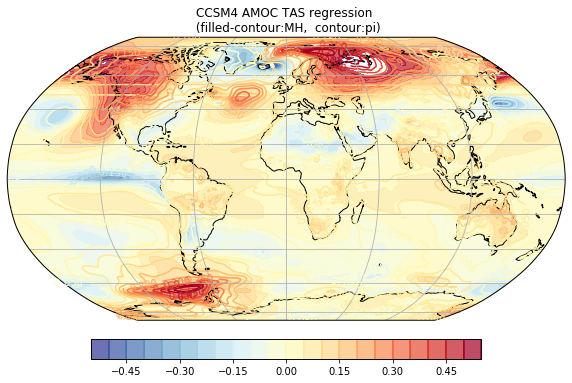

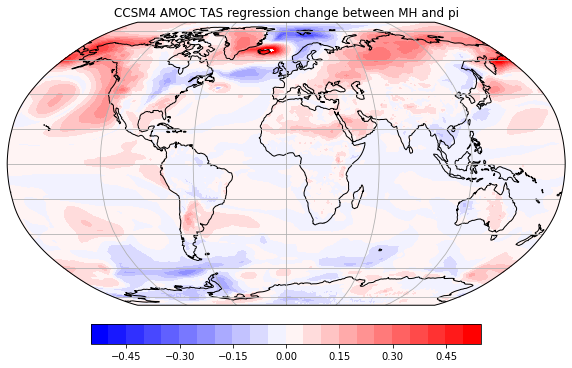

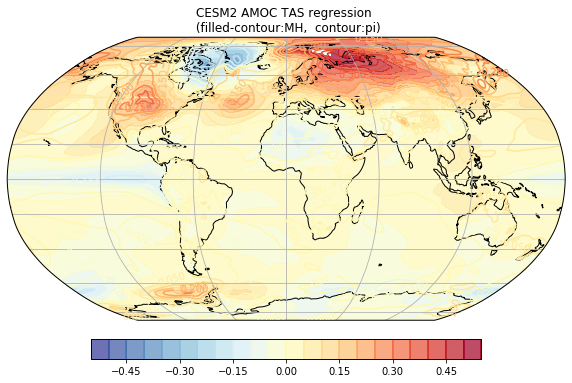

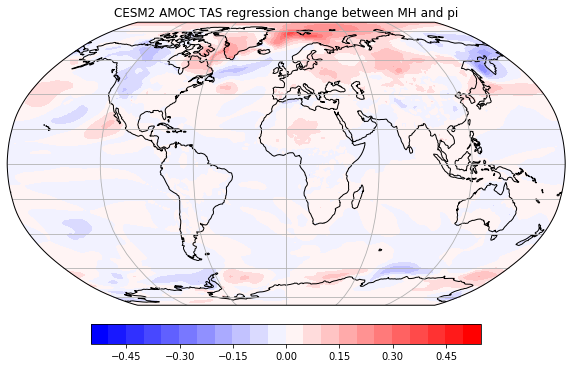

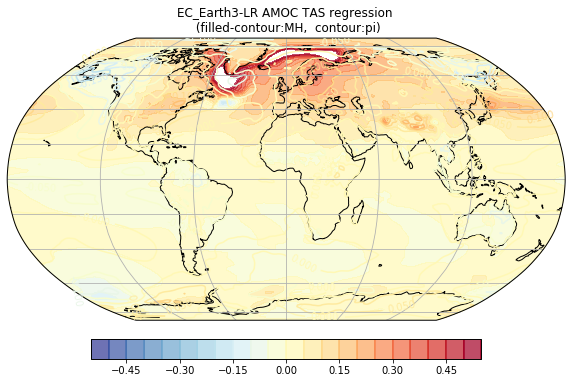

...

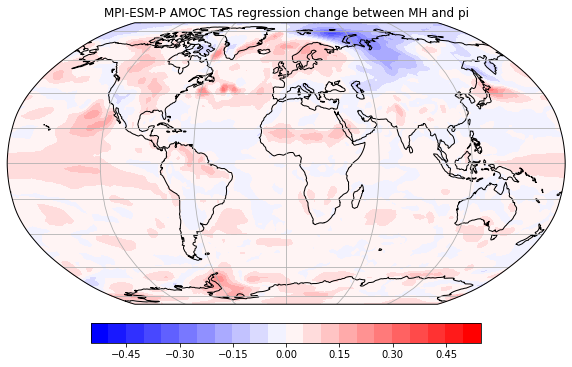

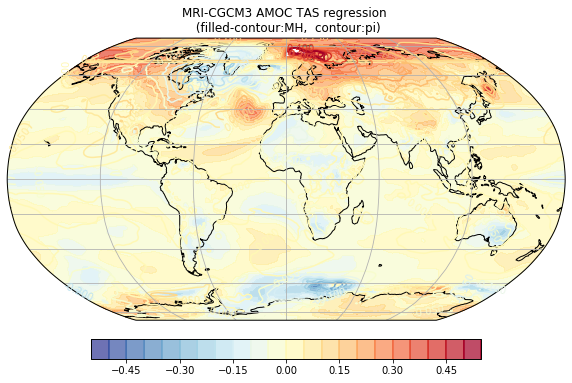

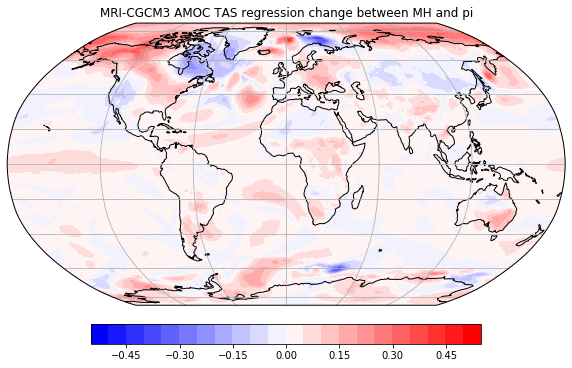

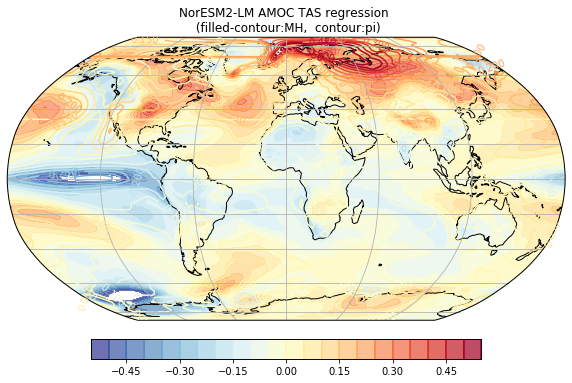

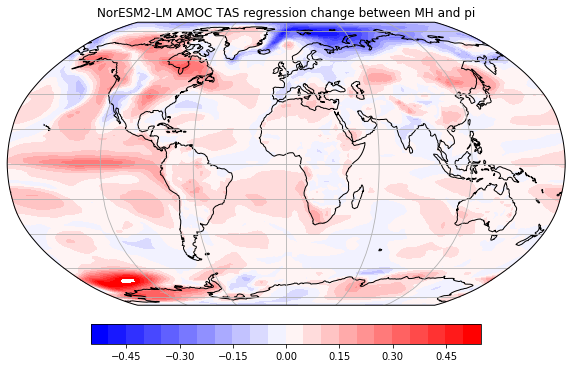

In [58]:
for i in range (0,len(modelname)):

    projection = ccrs.Robinson()

    transform=ccrs.PlateCarree()
    bounds = np.linspace(-0.55,0.55,23)
    norm = colors.BoundaryNorm(boundaries=bounds, ncolors=256)

    lat = name[i].lat
    lon = name[i].lon

    pi_lat = pi_name[i].lat
    pi_lon = pi_name[i].lon

    amoc_tas[i], lon = add_cyclic_point(amoc_tas[i], coord=lon)
    pi_amoc_tas[i], pi_lon = add_cyclic_point(pi_amoc_tas[i], coord=pi_lon)

    plt.figure(figsize=(10,7))
    ax1= plt.axes(projection=projection)

    ax1.coastlines()
    ax1.gridlines()
    
    fig=ax1.contourf(lon,lat, amoc_tas[i], levels=bounds, transform=transform, cmap='RdYlBu_r',norm=norm, alpha=0.7)
    pi_fig=ax1.contour(pi_lon, pi_lat, pi_amoc_tas[i], levels=bounds, transform=transform, cmap='RdYlBu_r',norm=norm)
    
    #pi_fig=ax1.contour(pi_lon, pi_lat, pi_amoc_sst[i], levels=bounds, transform=transform, colors='black',norm=norm)
    #If linestyles is None, the default is 'solid' unless the lines are monochrome. In that case, negative contours will be'dashed-line' 

    ax1.clabel(pi_fig, inline=1, fontsize=10)

    cax,kw = matplotlib.colorbar.make_axes(ax1,location='bottom',pad=0.05,shrink=0.7)
    plt.colorbar(fig,cax=cax,extend='both',**kw)
    plt.colorbar(pi_fig,cax=cax,extend='both',**kw)
    ax1.set(title='%s AMOC TAS regression \n (filled-contour:MH,  contour:pi)' %(model_name[i]))

#-------------------------------------------------------------------

    lat_2 = name[i].lat
    lon_2 = name[i].lon

    globals()[modelname[i]+'_amoc_tas_regression_change'], lon_2 = add_cyclic_point(globals()[modelname[i]+'_amoc_tas_regression_change'], coord=lon_2)

    plt.figure(figsize=(10,7))
    ax2= plt.axes(projection=projection)

    ax2.coastlines()
    ax2.gridlines()
    
    fig_2=ax2.contourf(lon,lat,globals()[modelname[i]+'_amoc_tas_regression_change'],levels=bounds, transform=transform,cmap='bwr',norm=norm)
    
    cax,kw = matplotlib.colorbar.make_axes(ax2,location='bottom',pad=0.05,shrink=0.7)
    plt.colorbar(fig_2,cax=cax,extend='both',**kw)
    ax2.set(title='%s AMOC TAS regression change between MH and pi' %(model_name[i]))

## load the variable: amoc_amo_lag_cor

In [254]:
ccsm_amoc_amo=ccsm.amoc_amo_lag_cor
pi_ccsm_amoc_amo=pi_ccsm.amoc_amo_lag_cor

cesm_amoc_amo=cesm.amoc_amo_lag_cor
pi_cesm_amoc_amo=pi_cesm.amoc_amo_lag_cor

ec_amoc_amo=ec.amoc_amo_lag_cor
pi_ec_amoc_amo=pi_ec.amoc_amo_lag_cor

fgoalsg2_amoc_amo=fgoalsg2.amoc_amo_lag_cor
pi_fgoalsg2_amoc_amo=pi_fgoalsg2.amoc_amo_lag_cor

giss_amoc_amo=giss.amoc_amo_lag_cor
pi_giss_amoc_amo=pi_giss.amoc_amo_lag_cor

hadgem_amoc_amo=hadgem.amoc_amo_lag_cor
pi_hadgem_amoc_amo=pi_hadgem.amoc_amo_lag_cor

inm_amoc_amo=inm.amoc_amo_lag_cor
pi_inm_amoc_amo=pi_inm.amoc_amo_lag_cor

ipsl_amoc_amo=ipsl.amoc_amo_lag_cor
pi_ipsl_amoc_amo=pi_ipsl.amoc_amo_lag_cor

mpi2_amoc_amo=mpi2.amoc_amo_lag_cor
pi_mpi2_amoc_amo=pi_mpi2.amoc_amo_lag_cor

mri_amoc_amo=mri.amoc_amo_lag_cor
pi_mri_amoc_amo=pi_mri.amoc_amo_lag_cor

mpip_amoc_amo=mpip.amoc_amo_lag_cor
pi_mpip_amoc_amo=pi_mpip.amoc_amo_lag_cor

mri3_amoc_amo=mri3.amoc_amo_lag_cor
pi_mri3_amoc_amo=pi_mri3.amoc_amo_lag_cor

noresm2_amoc_amo=noresm2.amoc_amo_lag_cor
pi_noresm2_amoc_amo=pi_noresm2.amoc_amo_lag_cor



In [255]:
amoc_amo=[ccsm_amoc_amo, cesm_amoc_amo, ec_amoc_amo, fgoalsg2_amoc_amo, 
         giss_amoc_amo, hadgem_amoc_amo, inm_amoc_amo, ipsl_amoc_amo, 
         mpi2_amoc_amo, mri_amoc_amo, mpip_amoc_amo, mri3_amoc_amo, 
         noresm2_amoc_amo]

In [256]:
pi_amoc_amo=[pi_ccsm_amoc_amo, pi_cesm_amoc_amo, pi_ec_amoc_amo, pi_fgoalsg2_amoc_amo, 
             pi_giss_amoc_amo, pi_hadgem_amoc_amo, pi_inm_amoc_amo, pi_ipsl_amoc_amo, 
             pi_mpi2_amoc_amo, pi_mri_amoc_amo, pi_mpip_amoc_amo, pi_mri3_amoc_amo, 
             pi_noresm2_amoc_amo]

## plotting:  amoc & AMO lead-lag correlation in mh &pi

In [257]:
def plot_amoc_amoc_lag_cor(j):
    '''plot the amoc / amo 30N lead-lag correlation in MH and pi'''

    fig=plt.figure() 
    ax=fig.add_subplot(111)

    amoc_amo[j].plot(ax=ax,label='mid-Holocene')
    pi_amoc_amo[j].plot(ax=ax,label='PI')
    ax.text(10,-0.93,'AMOC leads')
    ax.text(-15,-0.93,'AMO leads')
    ax.axvline(0,color='black',alpha=0.2, linewidth=1)
    ax.axhline(0,color='black',alpha=0.2, linewidth=1)

    ax.set(xlabel='Lag(yr)', ylabel='AMOC/AMO lead-lag correlation')
    ax.yaxis.set_minor_locator(MultipleLocator(0.1))
    ax.yaxis.set_major_locator(MultipleLocator(0.4))
    ax.xaxis.set_minor_locator(MultipleLocator(1))
    ax.xaxis.set_major_locator(MultipleLocator(5))
    ax.tick_params(which='both', direction='in', top=True, right=True, labelsize=10.)
    ax.set_ylim(-1,1)
    ax.set_xlim(-16,16)
    ax.legend(bbox_to_anchor=(0.5,0.27))
    ax.set(title='%s AMOC / AMO 30N lead-lag correlation' %(model_name[j]))

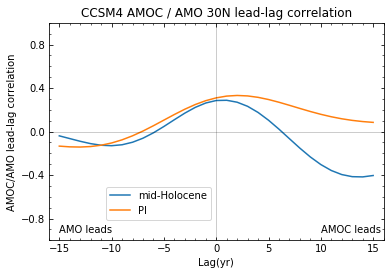

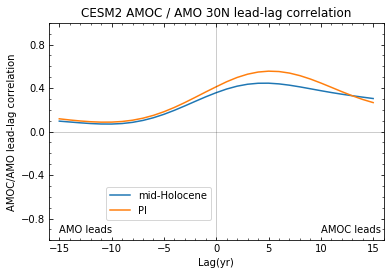

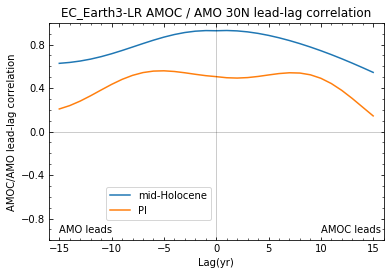

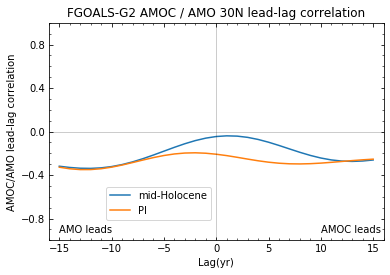

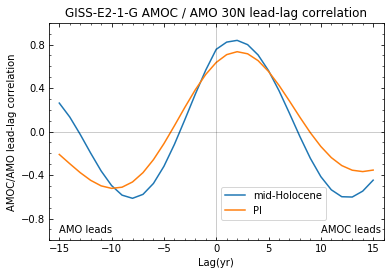

...

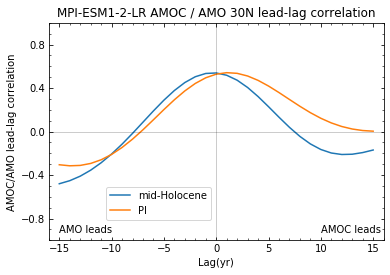

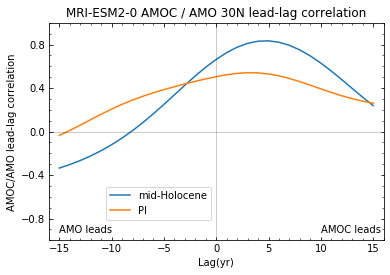

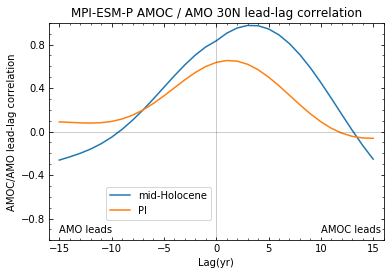

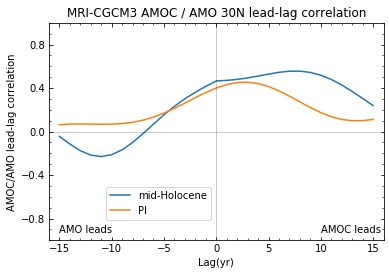

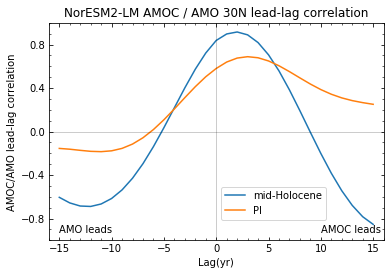

In [258]:
plot_amoc_amoc_lag_cor(0)
plot_amoc_amoc_lag_cor(1)
plot_amoc_amoc_lag_cor(2)
plot_amoc_amoc_lag_cor(3)
plot_amoc_amoc_lag_cor(4)
plot_amoc_amoc_lag_cor(5)
plot_amoc_amoc_lag_cor(6)
plot_amoc_amoc_lag_cor(7)
plot_amoc_amoc_lag_cor(8)
plot_amoc_amoc_lag_cor(9)
plot_amoc_amoc_lag_cor(10)
plot_amoc_amoc_lag_cor(11)
plot_amoc_amoc_lag_cor(12)


## load the variable: sic_nh_spatialmean_ann for mh &pi

In [8]:
ccsm_sic=ccsm.sic_nh_spatialmean_ann 
pi_ccsm_sic=pi_ccsm.sic_nh_spatialmean_ann 

cesm_sic=cesm.sic_nh_spatialmean_ann 
pi_cesm_sic=pi_cesm.sic_nh_spatialmean_ann 

#ec_sic=ec.sic_nh_spatialmean_ann              #EC-Earth3-LR model has no variable of 'sic_nh_spatialmean_ann'
pi_ec_sic=pi_ec.sic_nh_spatialmean_ann         # so delete the plot of this model 

fgoalsg2_sic=fgoalsg2.sic_nh_spatialmean_ann 
pi_fgoalsg2_sic=pi_fgoalsg2.sic_nh_spatialmean_ann 

giss_sic=giss.sic_nh_spatialmean_ann 
pi_giss_sic=pi_giss.sic_nh_spatialmean_ann 

hadgem_sic=hadgem.sic_nh_spatialmean_ann 
pi_hadgem_sic=pi_hadgem.sic_nh_spatialmean_ann 

inm_sic=inm.sic_nh_spatialmean_ann 
pi_inm_sic=pi_inm.sic_nh_spatialmean_ann 

ipsl_sic=ipsl.sic_nh_spatialmean_ann 
pi_ipsl_sic=pi_ipsl.sic_nh_spatialmean_ann 

mpi2_sic=mpi2.sic_nh_spatialmean_ann 
pi_mpi2_sic=pi_mpi2.sic_nh_spatialmean_ann 

mri_sic=mri.sic_nh_spatialmean_ann 
pi_mri_sic=pi_mri.sic_nh_spatialmean_ann 

mpip_sic=mpip.sic_nh_spatialmean_ann 
pi_mpip_sic=pi_mpip.sic_nh_spatialmean_ann 

mri3_sic=mri3.sic_nh_spatialmean_ann 
pi_mri3_sic=pi_mri3.sic_nh_spatialmean_ann 

noresm2_sic=noresm2.sic_nh_spatialmean_ann 
pi_noresm2_sic=pi_noresm2.sic_nh_spatialmean_ann 



In [11]:
sic=[ccsm_sic, cesm_sic, fgoalsg2_sic, giss_sic, 
     hadgem_sic, inm_sic, ipsl_sic, mpi2_sic, 
     mri_sic, mpip_sic, mri3_sic, noresm2_sic]

In [12]:
pi_sic=[pi_ccsm_sic, pi_cesm_sic, pi_fgoalsg2_sic, pi_giss_sic, 
        pi_hadgem_sic, pi_inm_sic, pi_ipsl_sic, pi_mpi2_sic, 
        pi_mri_sic, pi_mpip_sic, pi_mri3_sic, pi_noresm2_sic]

In [3]:
#no EC-Earth3-LR
name_sic=[ccsm,cesm,fgoalsg2,
      giss,hadgem,inm,ipsl,
      mpi2,mri,mpip,mri3,noresm2]

In [4]:
modelname_sic=['ccsm', 'cesm', 'fgoalsg2', 'giss',
          'hadgem', 'inm', 'ipsl', 'mpi2', 'mri',
          'mpip', 'mri3', 'noresm2']

In [5]:
model_name_sic=['CCSM4','CESM2','FGOALS-G2','GISS-E2-1-G','HadGEM3-CG31-LL',
           'INM-CM4-8','IPSL-CM6A-LR','MPI-ESM1-2-LR','MRI-ESM2-0','MPI-ESM-P',
            'MRI-CGCM3','NorESM2-LM']

In [83]:
#remove all 0, as the variable shows the 'Area fraction of grid cell covered by sea ice'
for j in range (0,len(modelname_sic)):
    globals()[modelname_sic[j]+'ice']=sic[j].where(sic[j]>0)   #ma.masked_where(sic[j]<=0,sic[j]) #same result
    globals()['pi_'+ modelname_sic[j]+'ice']=pi_sic[j].where(pi_sic[j]>0)   #ma.masked_where(pi_sic[j]<=0,pi_sic[j]) #same result
    globals()[modelname_sic[j]+'nh_sic_ann_change']= globals()[modelname_sic[j]+'ice'] - globals()['pi_'+ modelname_sic[j]+'ice']


## plotting:  the Northern hemsiphere sea ice cover (%) change between MH and pi

In [100]:
def plot_nh_sic_ann_change_2d(j):
    '''plot the Northern hemsiphere sea ice cover (%) change between MH and pi (for models with 2D horizonal grid)'''
    
    lon2d=name_sic[j].lon2d_ice_nh
    lat2d=name_sic[j].lat2d_ice_nh

    transform=ccrs.PlateCarree()
    bounds = np.linspace(-20,20, 21)
    norm = colors.BoundaryNorm(boundaries=bounds, ncolors=256)

    plt.figure(figsize=(8,8))

    ax = plt.axes(projection=ccrs.Orthographic(central_latitude=90.0))
    ax.add_feature(cartopy.feature.LAND, zorder=1,facecolor=cartopy.feature.COLORS['land_alt1'])
    ax.coastlines(resolution='110m', linewidth=0.5)
    ax.gridlines()

    fig=ax.pcolormesh(lon2d,lat2d,globals()[modelname_sic[j]+'nh_sic_ann_change'], transform=transform, cmap='bwr', norm=norm)

    cax,kw = matplotlib.colorbar.make_axes(ax,location='bottom',pad=0.05,shrink=0.7)
    plt.colorbar(fig,cax=cax,**kw)
    ax.set(title='%s nh SIC means (Annual) change between MH and pi' %(model_name_sic[j]))

In [99]:
def plot_nh_sic_ann_change_1d(j):
    '''plot the Northern hemsiphere sea ice cover (%) change between MH and pi (for models with 1D horizonal grid)'''
    
    lon=name_sic[j].i
    lat=name_sic[j].j

    transform=ccrs.PlateCarree()
    bounds = np.linspace(-20,20, 21)
    norm = colors.BoundaryNorm(boundaries=bounds, ncolors=256)

    plt.figure(figsize=(8,8))

    ax = plt.axes(projection=ccrs.Orthographic(central_latitude=90.0))
    ax.add_feature(cartopy.feature.LAND, zorder=1,facecolor=cartopy.feature.COLORS['land_alt1'])
    ax.coastlines(resolution='110m', linewidth=0.5)
    ax.gridlines()

    fig=ax.pcolormesh(lon,lat,globals()[modelname_sic[j]+'nh_sic_ann_change'], transform=transform, cmap='bwr', norm=norm)

    cax,kw = matplotlib.colorbar.make_axes(ax,location='bottom',pad=0.05,shrink=0.7)
    plt.colorbar(fig,cax=cax,**kw)
    ax.set(title='%s nh SIC means (Annual) change between MH and pi' %(model_name_sic[j]))

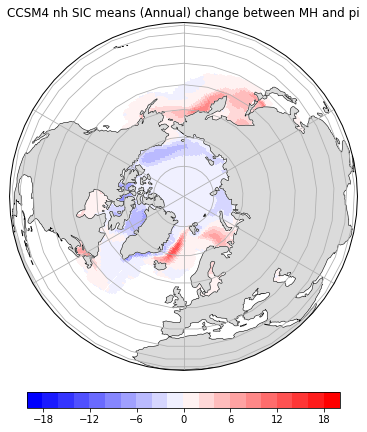

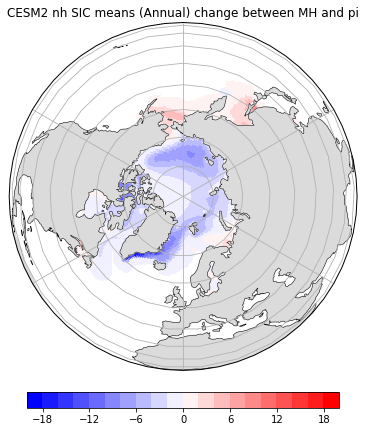

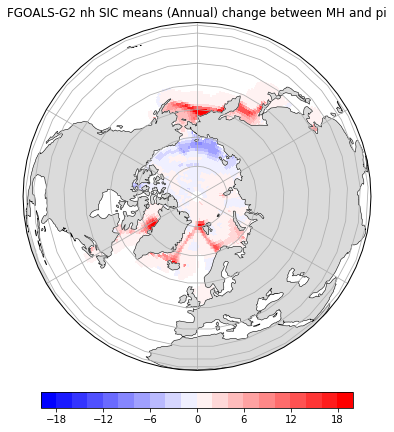

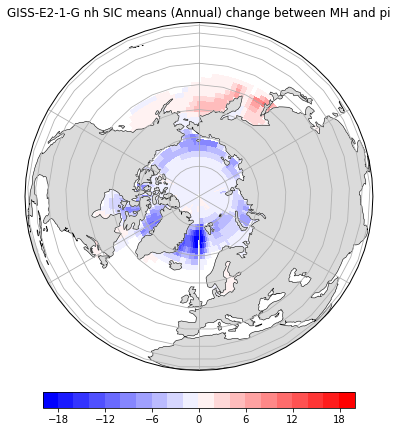

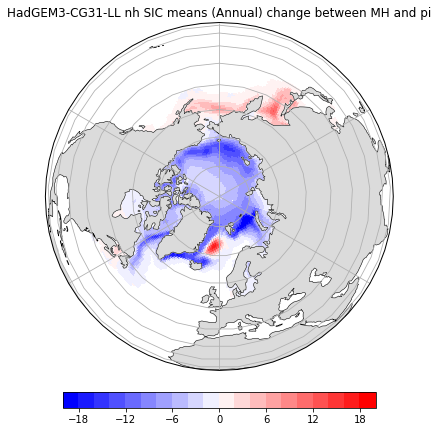

...

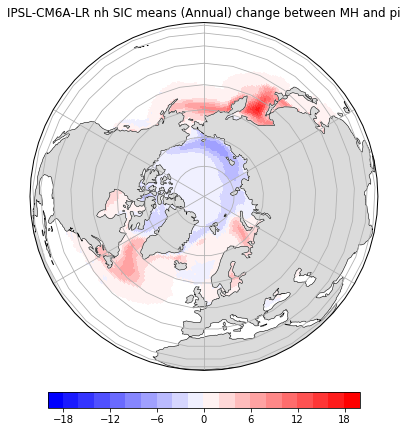

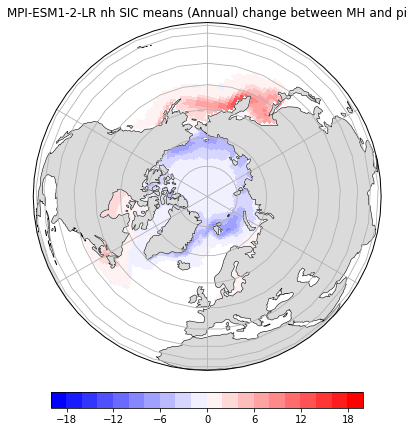

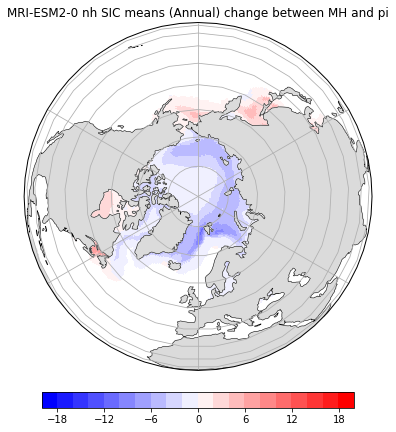

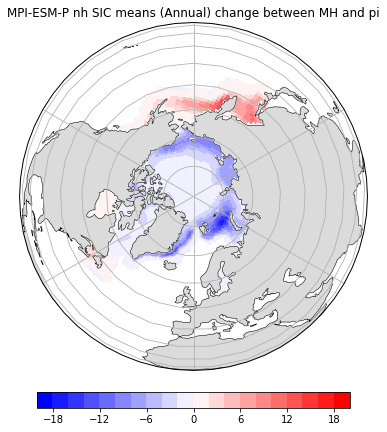

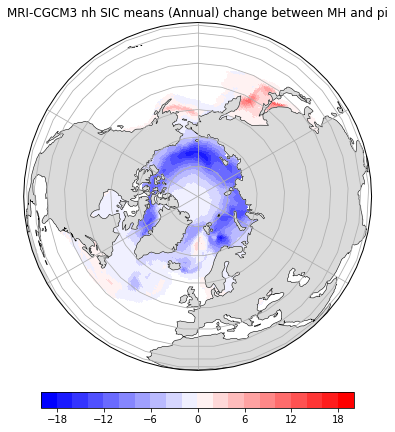

In [101]:
plot_nh_sic_ann_change_2d(0)
plot_nh_sic_ann_change_2d(1)
plot_nh_sic_ann_change_1d(2)
plot_nh_sic_ann_change_1d(3)
plot_nh_sic_ann_change_2d(4)
plot_nh_sic_ann_change_1d(5)
plot_nh_sic_ann_change_2d(6)
plot_nh_sic_ann_change_2d(7)
plot_nh_sic_ann_change_2d(8)
plot_nh_sic_ann_change_2d(9)
plot_nh_sic_ann_change_2d(10)
#plot_nh_sic_ann_change_1d(11)


ValueError: x and y arguments to pcolormesh cannot have non-finite values or be of type numpy.ma.core.MaskedArray with masked values

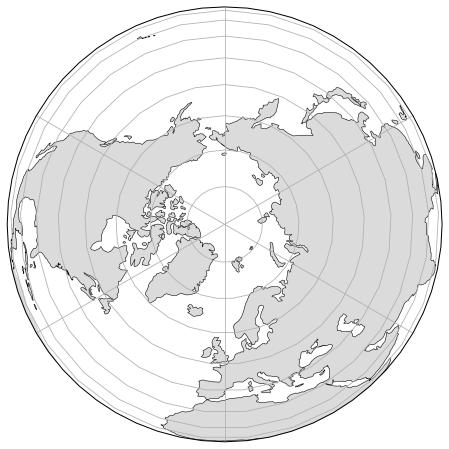

In [109]:
plot_nh_sic_ann_change_2d(11)

[Text(0.5, 1.0, 'NorESM2-LM nh SIC means (Annual) change between MH and pi')]

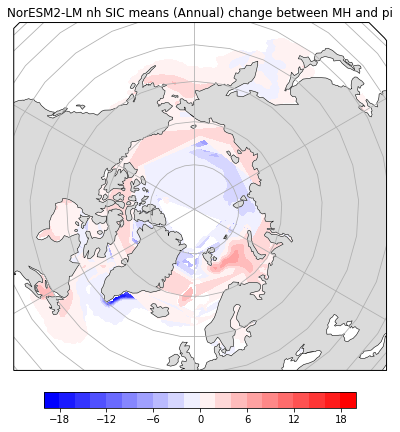

In [111]:

lon2d=noresm2.lon2d_ice_nh
lat2d=noresm2.lat2d_ice_nh


transform=ccrs.PlateCarree()
bounds = np.linspace(-20,20,21)
norm = colors.BoundaryNorm(boundaries=bounds, ncolors=256)

plt.figure(figsize=(8,8))

ax = plt.axes(projection=ccrs.Orthographic(central_latitude=90.0,globe=None))

ax.add_feature(cartopy.feature.LAND, zorder=1,facecolor=cartopy.feature.COLORS['land_alt1'])
ax.coastlines(resolution='110m', linewidth=0.5)
ax.gridlines()

fig=ax.contourf(lon2d,lat2d,globals()[modelname_sic[11]+'nh_sic_ann_change'], levels=bounds, transform=transform, cmap='bwr', norm=norm)


cax,kw = matplotlib.colorbar.make_axes(ax,location='bottom',pad=0.05,shrink=0.7)
plt.colorbar(fig,cax=cax,**kw)
ax.set(title='%s nh SIC means (Annual) change between MH and pi' %(model_name_sic[11]))

## load the variable: sst_spatialmean_ann for mh & pi

In [59]:
ccsm_sst_ann=ccsm.sst_spatialmean_ann
pi_ccsm_sst_ann=pi_ccsm.sst_spatialmean_ann

cesm_sst_ann=cesm.sst_spatialmean_ann
pi_cesm_sst_ann=pi_cesm.sst_spatialmean_ann

ec_sst_ann=ec.sst_spatialmean_ann
pi_ec_sst_ann=pi_ec.sst_spatialmean_ann

fgoalsg2_sst_ann=fgoalsg2.sst_spatialmean_ann
pi_fgoalsg2_sst_ann=pi_fgoalsg2.sst_spatialmean_ann

giss_sst_ann=giss.sst_spatialmean_ann
pi_giss_sst_ann=pi_giss.sst_spatialmean_ann

hadgem_sst_ann=hadgem.sst_spatialmean_ann
pi_hadgem_sst_ann=pi_hadgem.sst_spatialmean_ann

inm_sst_ann=inm.sst_spatialmean_ann
pi_inm_sst_ann=pi_inm.sst_spatialmean_ann

ipsl_sst_ann=ipsl.sst_spatialmean_ann
pi_ipsl_sst_ann=pi_ipsl.sst_spatialmean_ann

mpi2_sst_ann=mpi2.sst_spatialmean_ann
pi_mpi2_sst_ann=pi_mpi2.sst_spatialmean_ann

mri_sst_ann=mri.sst_spatialmean_ann
pi_mri_sst_ann=pi_mri.sst_spatialmean_ann

mpip_sst_ann=mpip.sst_spatialmean_ann
pi_mpip_sst_ann=pi_mpip.sst_spatialmean_ann

mri3_sst_ann=mri3.sst_spatialmean_ann
pi_mri3_sst_ann=pi_mri3.sst_spatialmean_ann

noresm2_sst_ann=noresm2.sst_spatialmean_ann
pi_noresm2_sst_ann=pi_noresm2.sst_spatialmean_ann



In [60]:
sst_ann=[ccsm_sst_ann, cesm_sst_ann, ec_sst_ann, fgoalsg2_sst_ann, 
         giss_sst_ann, hadgem_sst_ann, inm_sst_ann, ipsl_sst_ann, 
         mpi2_sst_ann, mri_sst_ann, mpip_sst_ann, mri3_sst_ann, 
         noresm2_sst_ann]

In [61]:
pi_sst_ann=[pi_ccsm_sst_ann, pi_cesm_sst_ann, pi_ec_sst_ann, pi_fgoalsg2_sst_ann, 
            pi_giss_sst_ann, pi_hadgem_sst_ann, pi_inm_sst_ann, pi_ipsl_sst_ann, 
            pi_mpi2_sst_ann, pi_mri_sst_ann, pi_mpip_sst_ann, pi_mri3_sst_ann, 
            pi_noresm2_sst_ann]

In [62]:
for j in range (0,len(modelname)):
    globals()[modelname[j]+'_sst_mean_ann_change']=sst_ann[j]-pi_sst_ann[j]

## plotting: map plot of the global mean sst change (mh minus pi) (annual)  

In [63]:
def plot_sst_mean_ann_change(j):
    '''plot the SST mean (annual) change between MH and pi'''
    
    lat = name[j].lat
    lon = name[j].lon

    globals()[modelname[j]+'_sst_mean_ann_change'], lon = add_cyclic_point(globals()[modelname[j]+'_sst_mean_ann_change'], coord=lon)

    plt.figure(figsize=(10,7))
    ax= plt.axes(projection=projection)

    ax.coastlines()
    ax.gridlines()
    
    fig=ax.contourf(lon,lat,globals()[modelname[j]+'_sst_mean_ann_change'],levels=bounds, transform=transform,cmap='bwr',norm=norm)

    cax,kw = matplotlib.colorbar.make_axes(ax,location='bottom',pad=0.05,shrink=0.7)
    plt.colorbar(fig,cax=cax,extend='both',**kw)
    ax.set(title='%s SST mean (annual) change between MH and pi' %(model_name[j]))

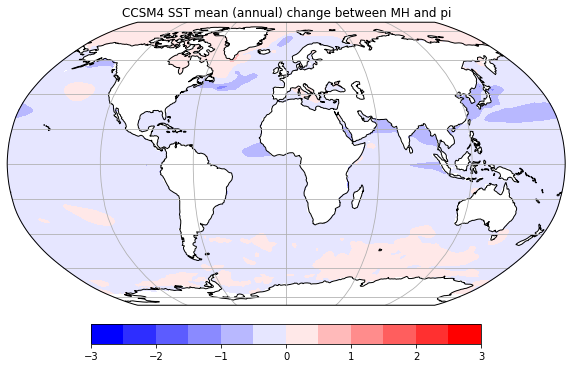

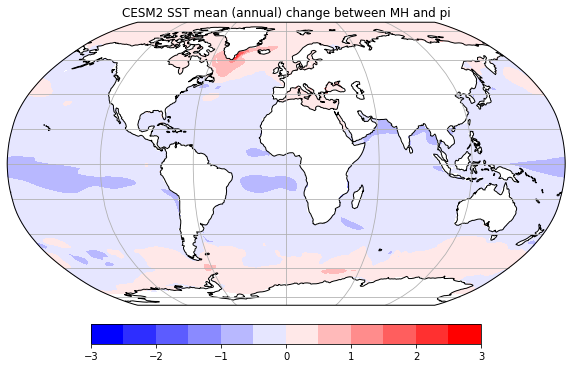

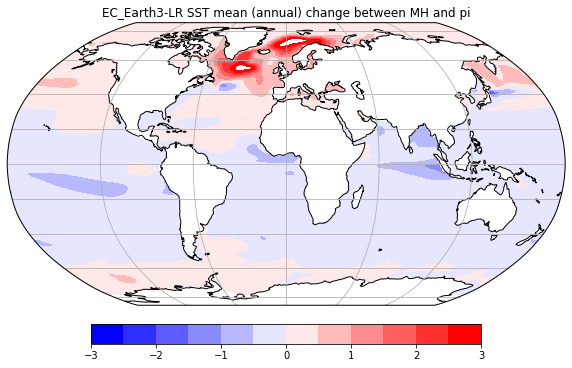

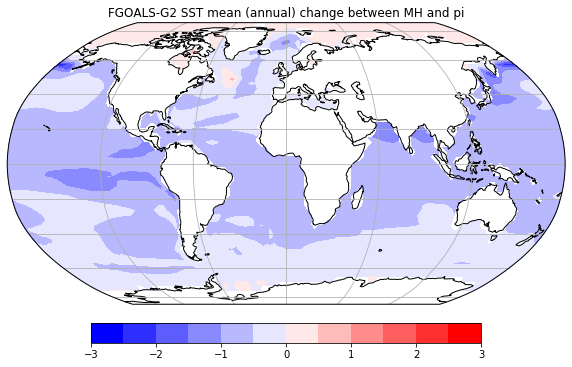

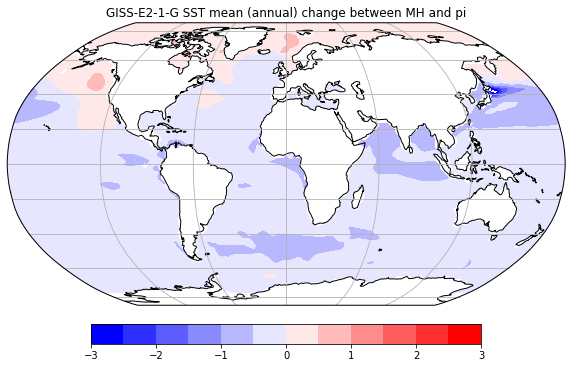

...

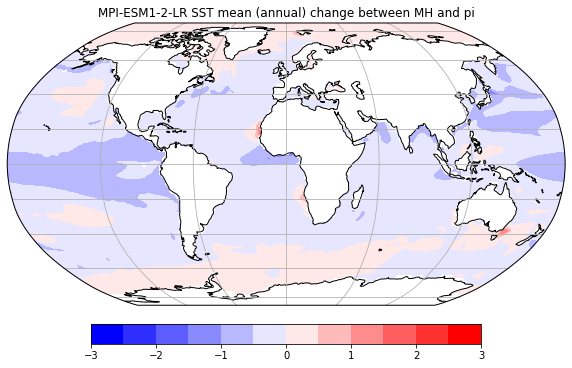

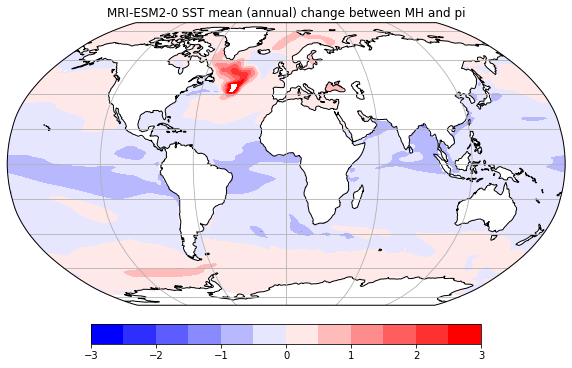

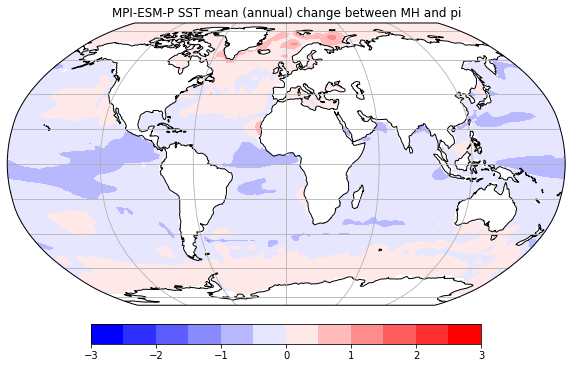

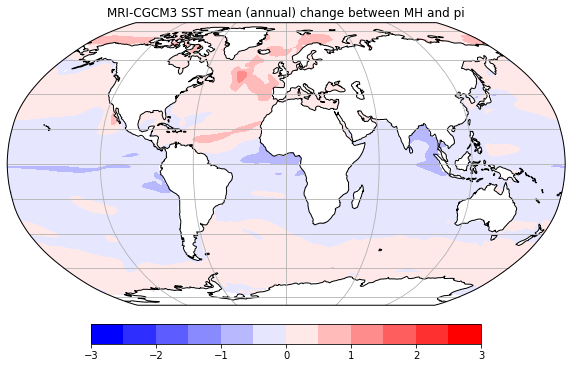

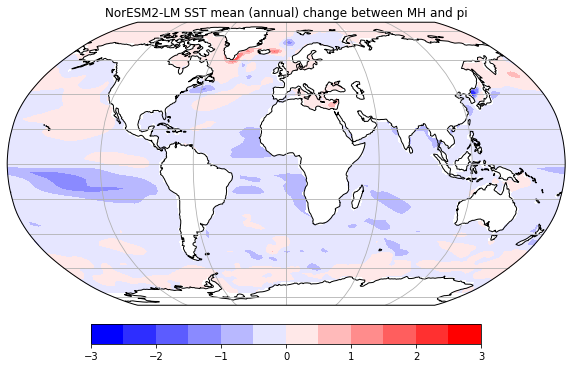

In [64]:
projection = ccrs.Robinson()

transform=ccrs.PlateCarree()
bounds = np.linspace(-3,3,13)
norm = colors.BoundaryNorm(boundaries=bounds, ncolors=256)

plot_sst_mean_ann_change(0)
plot_sst_mean_ann_change(1)
plot_sst_mean_ann_change(2)
plot_sst_mean_ann_change(3)
plot_sst_mean_ann_change(4)
plot_sst_mean_ann_change(5)
plot_sst_mean_ann_change(6)
plot_sst_mean_ann_change(7)
plot_sst_mean_ann_change(8)
plot_sst_mean_ann_change(9)
plot_sst_mean_ann_change(10)
plot_sst_mean_ann_change(11)
plot_sst_mean_ann_change(12)